In [43]:
pi_image = cv2.imread("small_kris.jpg")
pi_image = cv2.cvtColor(pi_image, cv2.COLOR_BGR2RGB)

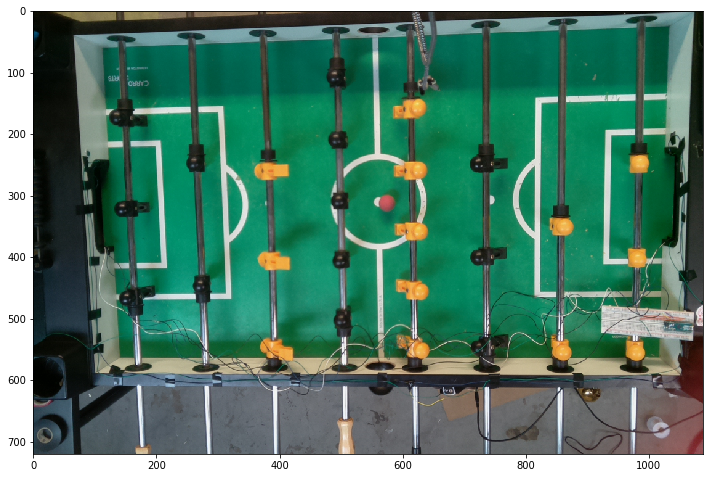

In [44]:
fig = plt.figure(figsize=(12, 20))
plt.imshow(pi_image)
plt.show()

In [47]:
pi_img = markFrame(pi_image, 20, (0, 0))

In [99]:
pi_img = markFrame(fr, 40, (0, 0))

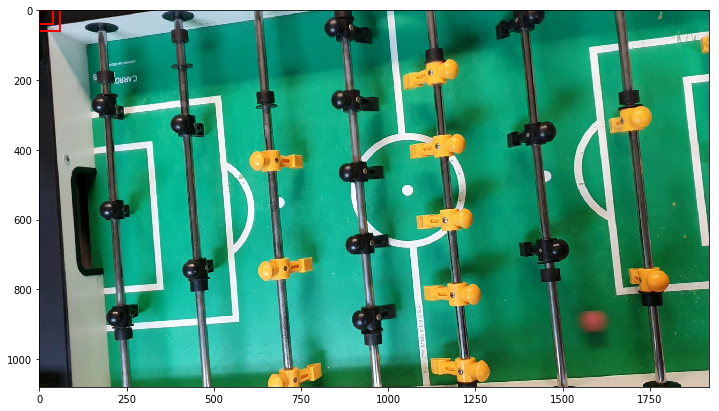

In [100]:
fig = plt.figure(figsize=(12, 20))
plt.imshow(pi_img)
plt.show()

In [97]:
fr = mvd[123]

In [152]:
import cv2
import math
import numpy as np
from matplotlib import pyplot as plt
import scipy.stats as st


def drawSquare(frame, pointTopLeft, squareSize, color=(255, 0, 0)):
    """
    @param frame - np.ndarray(np.uint8)

    @returns modified frame - np.ndarray(np.uint8)
    """
    modified_frame = frame.copy()
    y, x = pointTopLeft
#     print(x, y)
    cv2.rectangle(modified_frame, (x, y), (x + squareSize, y + squareSize), color, 5)
    return modified_frame    

def gkern(kernlen=60, nsig=0.5):
    """Returns a 2D Gaussian kernel."""

    x = np.linspace(-nsig, nsig, kernlen+1)
    kern1d = np.diff(st.norm.cdf(x))
    kern2d = np.outer(kern1d, kern1d)
    return kern2d/kern2d.sum()

def spiral(side):
    x = y = 0
    dx = 0
    dy = -1
    for i in range(side ** 2):
        if (-side / 2 < x <= side / 2):
            yield (x, y)
        if x == y or (x < 0 and x == -y) or (x > 0 and x == 1 - y):
            dx, dy = -dy, dx
        x, y = x + dx, y + dy
        
def downsample(frame, k):
    obj = (slice(None, None, k))
    return frame[obj, obj]


def getBallPositionApprox(frame, lastBallPosition, certainty, BALLSIZE, RODSIZE):
    generatorPosition = spiral(2 * RODSIZE)
    x, y = lastBallPosition
    mx = max(0, x - RODSIZE)
    my = max(0, y - RODSIZE)
    subframe = frame[mx : x + RODSIZE, my : y + RODSIZE, : ].astype(int)
    pnkCf = magicFormula(subframe, 4)
    centerPoint = np.unravel_index(pnkCf.argmin(), pnkCf.shape)
    a, b = centerPoint
    a = max(0, a - BALLSIZE // 2) + x - RODSIZE
    b = max(0, b - BALLSIZE // 2) + y - RODSIZE
    topLeftPoint = (a, b)
    return topLeftPoint, pnkCf[a, b]
#     maxSoFar = certainty
#     ballPosition = lastBallPosition
#     while True:
#         try:
#             positionToCheck = next(generatorPosition)
#         except StopIteration:
#             # return the highest one
#             break  # Iterator exhausted: stop the loop

def getBallPosition(frame, BALLSIZE, KERNEL):
    """
    Return top left point of a NxN square with the most probable position of the ball
    """
    frameInt = frame.astype(int)
    confidence = magicFormula(frameInt, BALLSIZE, KERNEL)
    centerPoint = np.unravel_index(confidence.argmin(), confidence.shape)
    x, y = centerPoint
    x = max(0, x - BALLSIZE // 2)
    y = max(0, y - BALLSIZE // 2)
    topLeftPoint = (x, y)
    return topLeftPoint, confidence[x, y]



def markFrame(frame, BALLSIZE, lastBallPosition, KERNEL):
#     frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
#     downsampledFrame = downsample(frame, 4)
#     ballPosition, certainty = getBallPosition(downsampledFrame, BALLSIZE // 4)
    ballPosition, certainty = getBallPosition(frame, BALLSIZE, KERNEL)
#     ballPosition = tuple([x * 4 for x in ballPosition])
#             print(ballPosition)
    if ballPosition == (0, 0):
        ballPosition = lastBallPosition
    else:
        lastBallPosition = ballPosition
    return drawSquare(frame, ballPosition, BALLSIZE)
#     return cv2.cvtColor(drawSquare(frame, ballPosition, BALLSIZE), cv2.COLOR_RGB2BGR)

def markVideo(filename, BALLSIZE, RODSIZE):
    vidcap = cv2.VideoCapture(filename)
    success = True
    lastBallPosition = (0, 0)
    certainty = 0
    markedVideo = []
    while len(markedVideo) < 151:
        if len(markedVideo) % 100 == 0:
            print(f"Frame {len(markedVideo)}")
        success, frame = vidcap.read()

        if not success:
            break
        frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)
        downsampledFrame = downsample(frame, 4)
        if certainty < 0:
            ballPosition, certainty = getBallPositionApprox(frame, lastBallPosition, certainty, BALLSIZE, RODSIZE)
            markedVideo.append(drawSquare(frame, ballPosition, BALLSIZE, color=(0, 255, 0)))
        else:
            ballPosition, certainty = getBallPosition(downsampledFrame, BALLSIZE // 4)
            ballPosition = tuple([x * 4 for x in ballPosition])
#             print(ballPosition)
            if ballPosition == (0, 0):
                ballPosition = lastBallPosition
            else:
                lastBallPosition = ballPosition

            markedVideo.append(drawSquare(frame, ballPosition, BALLSIZE))
        
    return markedVideo

def magicFormula(frameInt, KERNEL, kernel_size = 60):
    pinkness = abs(160 - frameInt[ : , : , 0]) \
                + abs(100 - frameInt[ : , : , 1]) \
                + abs(100 - frameInt[ : , : , 2])
    shadowPinkiness = abs(160 - frameInt[ : , : , 0]) \
                + abs(100 - frameInt[ : , : , 1]) \
                + abs(100 - frameInt[ : , : , 2])
    
#     yellowness = abs(230 - frameInt[ : , : , 0]) \
#                 + abs(140 - frameInt[ : , : , 1]) \
#                 + abs(25 - frameInt[ : , : , 2])
    
#     kernel = KERNEL
#     kernel = np.ones((kernel_size, kernel_size))
    pinknessConfidence = np.minimum(cv2.filter2D(pinkness.astype(np.float32), 1, KERNEL), cv2.filter2D(shadowPinkiness.astype(np.float32), 1, KERNEL)) 
    plt.imshow(pinknessConfidence)
    return pinknessConfidence
                
    
KERNEL = gkern(20)

In [148]:
fr = pi_image

In [149]:
s = markFrame(fr[50:-120, 120:-100, : ], 20, (0, 0), KERNEL)

error: OpenCV(4.1.1) /io/opencv/modules/imgproc/src/filter.simd.hpp:3110: error: (-215:Assertion failed) cn == CV_MAT_CN(dstType) && ddepth >= sdepth in function 'getLinearFilter'


In [154]:
s = markFrame(fr, 20, (0, 0), KERNEL)

error: OpenCV(4.1.1) /io/opencv/modules/imgproc/src/filter.simd.hpp:3110: error: (-215:Assertion failed) cn == CV_MAT_CN(dstType) && ddepth >= sdepth in function 'getLinearFilter'


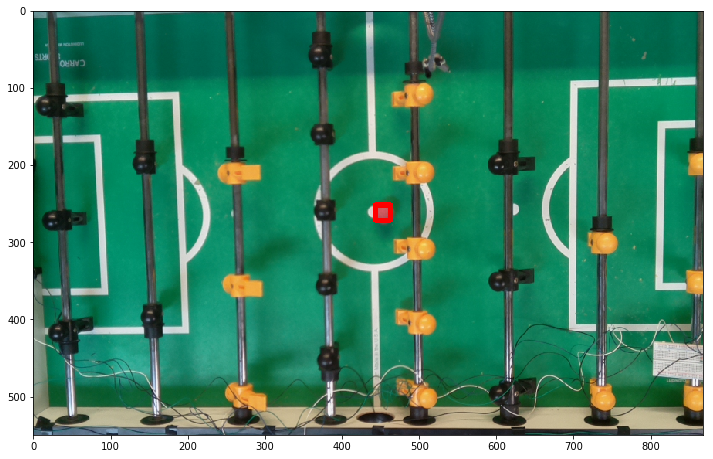

In [142]:
fig = plt.figure(figsize=(12, 20))
plt.imshow(s)
plt.show()

In [12]:
mvd = markVideo('test.mp4', 60, 200)

Frame 0
Frame 100


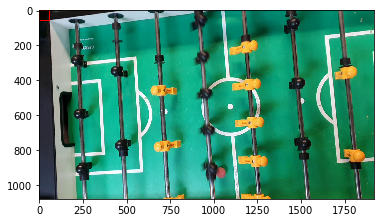

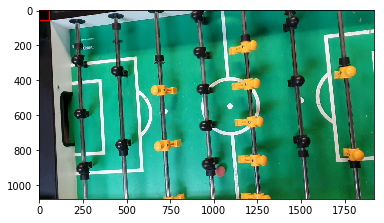

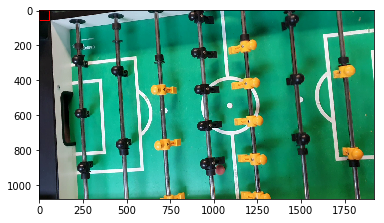

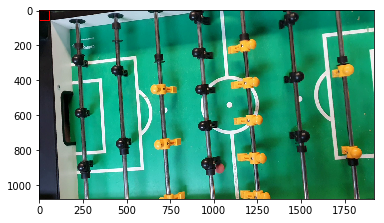

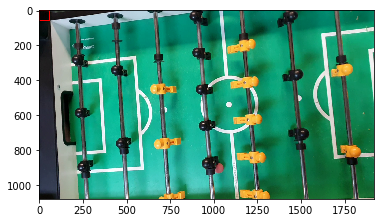

...

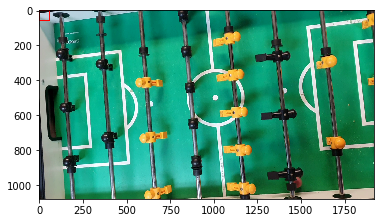

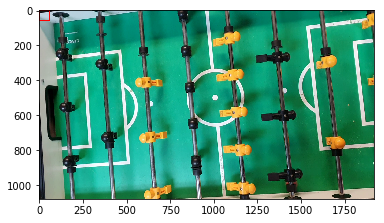

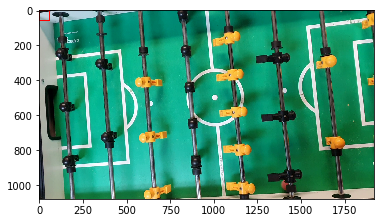

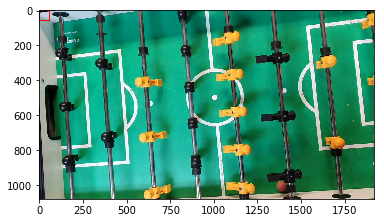

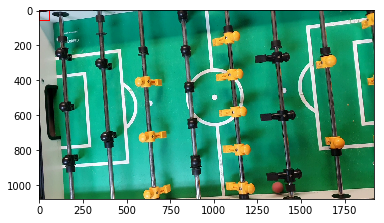

In [13]:
# fig = plt.figure(figsize=(12, 20))
for i in range(100, 150):
    plt.imshow(mvd[i])
    plt.show()

In [ ]:
fig = plt.figure(figsize=(12, 20))
plt.imshow(drawSquare(mvd[144], getBallPosition(mvd[144], 60)[0], 60))

In [ ]:
mvd[144][982, 1480, : ]

In [ ]:
mvd[144][735, 1680, :]

In [ ]:
fig = plt.figure(figsize=(12, 20))
plt.imshow(mvd[144][735:820,1680:1720 , :])
plt.show()

In [ ]:
fig = plt.figure(figsize=(12, 20))
for i in range(100, 150):
    plt.imshow(mvd[i])
    plt.show()

In [ ]:
width = 1080
height = 1920
FPS = 24

# fourcc = cv2.VideoWriter_fourcc(*'MP42')
video = cv2.VideoWriter('./opa.avi', 0, float(FPS), (width, height))

for frame in mvd:
    video.write(frame)
    
video.release()

In [ ]:
writer = cv2.VideoWriter("output.avi", cv2.VideoWriter_fourcc(*"MJPG"), 30,(1080, 1920))

for frame in mvd:
    writer.write(frame)

writer.release()

In [ ]:
video.release()

In [ ]:
fig = plt.figure(figsize=(12, 20))
plt.imshow(frame)

In [ ]:
frameWithSquare = getBallPosition(frame, 60)

In [ ]:
y, x = frameWithSquare
y -= 30
x -= 30

In [ ]:
s = drawSquare(frame, (y, x), 60)

In [ ]:
fig = plt.figure(figsize=(12, 20))
plt.imshow(s)
plt.show()

In [ ]:
f = abs(190 - frame[ : , : , 0]) + abs(100 - frame[ : , : , 1]) + abs(100 - frame[ : , : , 2])


fig = plt.figure(figsize=(12, 20))
plt.imshow(f, cmap='gray', vmin=np.min(f), vmax=np.max(f))

In [101]:
frameInt = frame.astype(int)
f = abs(190 - frameInt[ : , : , 0]) + abs(100 - frameInt[ : , : , 1]) + abs(100 - frameInt[ : , : , 2])
ballX, ballY = [60, 60]
minRed = math.inf
maxI = 0
maxJ = 0
m, n = f.shape
for i in range(m - ballX):
    for j in range(n - ballY):
        subframe = f[i : i + ballX, j : j + ballY]
        subframeRed = np.mean(subframe)
        if subframeRed < minRed:
            minRed = subframeRed
#             print(f"New maxred is {maxRed}")
            maxI = i
            maxJ = j

plt.imshow(frame[maxI : maxI + ballX, maxJ : maxJ + ballY])

KeyboardInterrupt: 

In [ ]:
print(maxI, maxJ)

In [ ]:
c = r / g

In [ ]:
d = r / b

In [ ]:
d

In [ ]:
r, g, b = frame[maxI, maxJ]

In [ ]:
frame[maxI, maxJ]

In [ ]:
frame[676, 776]

In [ ]:
f = frame[ : , : , 0] ** 2 - frame[ : , : , 1] - frame[ : , : , 2]

In [ ]:
f[0, 0]

In [ ]:
frame[0, 0]

In [ ]:
49 - 5 - 3

In [ ]:
r = frame[ : , : , 0]
g = frame[ : , : , 1]
b = frame[ : , : , 2]

In [ ]:
r.shape

In [ ]:
f = r - g - b

In [ ]:
f[849, 1666]

In [ ]:
z = frame[849, 1666, 0] 

In [ ]:
type(z)

In [ ]:
frame[849, 1666, 0] - frame[849, 1666, 1] - frame[849, 1666, 2]

In [ ]:
frame[849, 1666]

In [ ]:
np.mean(f[849 : 849 + 70, 1666 : 1666 + 70])

In [ ]:
np.mean(f[870:940, 1240:1300])

In [ ]:
f[870:940, 1240:1300]

In [ ]:
f[849 : 849 + 70, 1666 : 1666 + 70]

In [ ]:
frame[900, 1380]

In [ ]:
# fig = plt.figure(figsize=(12, 20))
ball = frame[870:930, 1350:1410]
plt.imshow(frame[870:930, 1350:1410])

In [ ]:
np.mean(ball[ : , : , 0]) - np.mean(ball[ : , : , 1]) - np.mean(ball[ : , : , 2])

In [ ]:
frame[300:450][:][1:2].shape

In [ ]:
type(frame)

In [ ]:
frame[0][0]

In [ ]:
def getVal(i, j, frame):
    return np.mean(frame[i : i + ballX, j : j + ballY, 0]) - np.mean(frame[i : i + ballX, j : j + ballY, 1]) - np.mean(frame[i : i + ballX, j : j + ballY, 2]) 